In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import pandas as pd
import pandas

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import time
import json
import copy
import scipy.io
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import numpy as np
from PIL import Image
from collections import OrderedDict
import cv2
import sys
import argparse

import torch
from torch import nn, optim
from torch.optim import lr_scheduler
from torch.autograd import Variable, Function
from torchvision import datasets, models, transforms, utils
import torchvision
import torch.nn.functional as F
import torch.nn as nn

In [3]:
image_data_transforms = {
    'training': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'validation': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'testing': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

In [4]:
# Step 1: Install Kaggle API
!pip install kaggle

# Step 2: Upload Kaggle API key (You need to upload the kaggle.json file)
from google.colab import files
files.upload()  # This will prompt you to upload kaggle.json from your local machine

# Step 3: Set up Kaggle API credentials
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content"

# Step 4: Download the dataset (replace with your specific dataset ID)
!kaggle datasets download -d marquis03/flower-classification

# Step 5: Unzip the dataset (if it's a zip file)
!unzip flower-classification.zip


Streaming output truncated to the last 5000 lines.
  inflating: train/iris/17858672081_4b4d071116_c.jpg  
  inflating: train/iris/17885928250_451875aec2_c.jpg  
  inflating: train/iris/17948299355_2161a031db_c.jpg  
  inflating: train/iris/17959086836_3e706d918b_c.jpg  
  inflating: train/iris/18054931376_23052f68d0_c.jpg  
  inflating: train/iris/18059533553_186ccb451a_c.jpg  
  inflating: train/iris/18076633321_400ea17b5a_c.jpg  
  inflating: train/iris/18120244292_ea11fcc9c5_c.jpg  
  inflating: train/iris/181379030_afebe26851_c.jpg  
  inflating: train/iris/18141122602_118114762d_c.jpg  
  inflating: train/iris/18256508742_af6a8f4222_c.jpg  
  inflating: train/iris/18280071332_c6bc90d75a_c.jpg  
  inflating: train/iris/18348714266_33a7bf205f_c.jpg  
  inflating: train/iris/18504796248_9548f45757_c.jpg  
  inflating: train/iris/18519018712_9ae5d4be08_c.jpg  
  inflating: train/iris/18551525352_70323e50e0_c.jpg  
  inflating: train/iris/18607022104_4ae51cd825_c.jpg  
  inflating: tra

In [5]:
import os
!pip install split-folders
import splitfolders

In [6]:
splitfolders.ratio('/content/train', output="./test", seed=1337, ratio=(.8, .2)) # default values


Copying files: 13642 files [00:04, 3122.79 files/s]


In [7]:
train_dir = '/content/train'
valid_dir = '/content/val'
test_dir = '/content/val'

batch_size = 64
training_data = torchvision.datasets.ImageFolder(train_dir, transform=image_data_transforms['training'])
validation_data = torchvision.datasets.ImageFolder(valid_dir, transform=image_data_transforms['validation'])
testing_data = torchvision.datasets.ImageFolder(test_dir, transform=image_data_transforms['testing'])

train_loader = torch.utils.data.DataLoader(training_data, batch_size=batch_size, shuffle=True)
validation_loader = torch.utils.data.DataLoader(validation_data, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(testing_data, batch_size=batch_size)

In [8]:
model = models.resnet18(num_classes=14,pretrained=False)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [9]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device: {}".format(device))
model.to(device)

Device: cuda:0


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [10]:
def plot_data_loader(data_loader, gridDims):
    """
    Plots images from the data loader in a grid specified by gridDims.
    Handles batch sizes larger than the grid.
    """
    fig, axes = plt.subplots(nrows=gridDims[0], ncols=gridDims[1], figsize=(5 * gridDims[1], 5 * gridDims[0]))
    axes = axes.flatten()  # Flatten for easier iteration
    dataiter = iter(data_loader)
    images, _ = next(dataiter)  # Get a single batch

    num_images = gridDims[0] * gridDims[1]  # Total images to display
    for idx in range(num_images):
        if idx < len(images):  # Ensure we don't exceed the batch size
            axes[idx].imshow(np.transpose(images[idx].numpy(), (1, 2, 0)))
            axes[idx].axis('off')  # Hide axis for better visualization
        else:
            axes[idx].axis('off')  # Turn off unused subplots

    plt.tight_layout()
    plt.show()


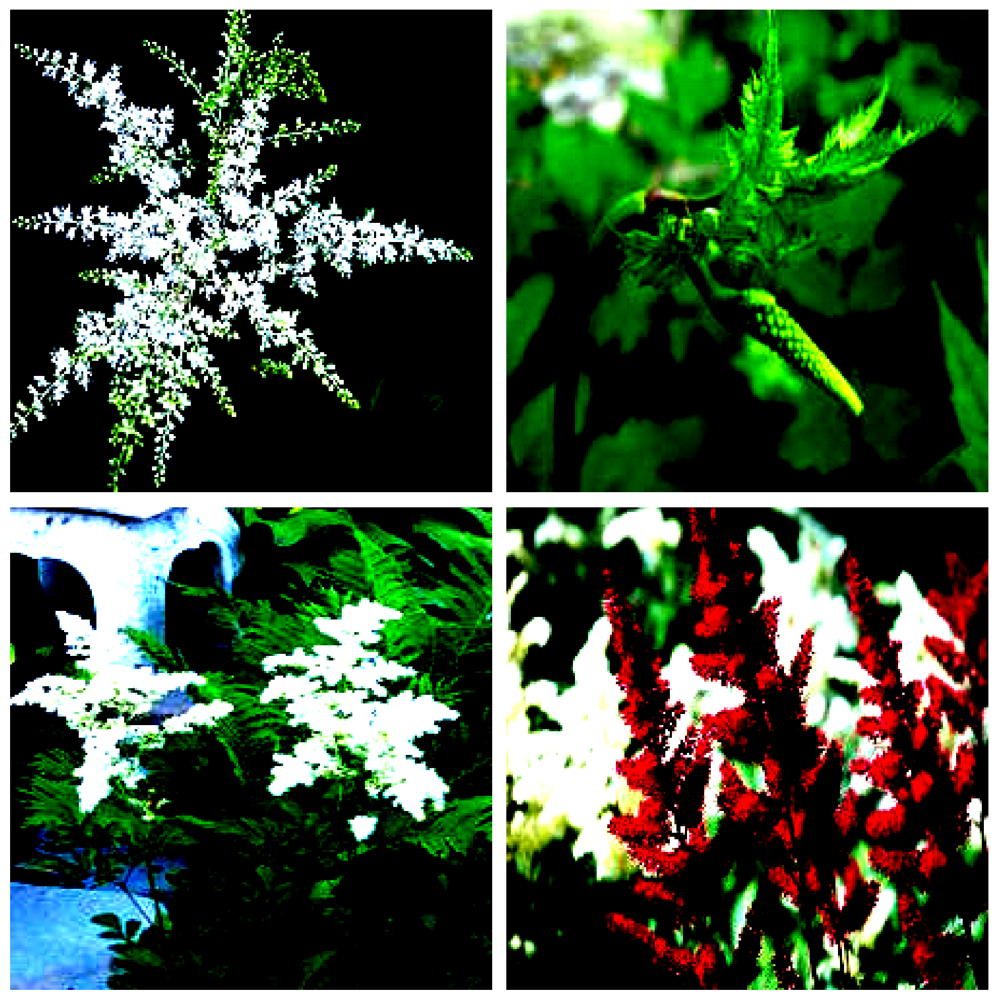

In [11]:
plot_data_loader(test_loader, [2, 2])

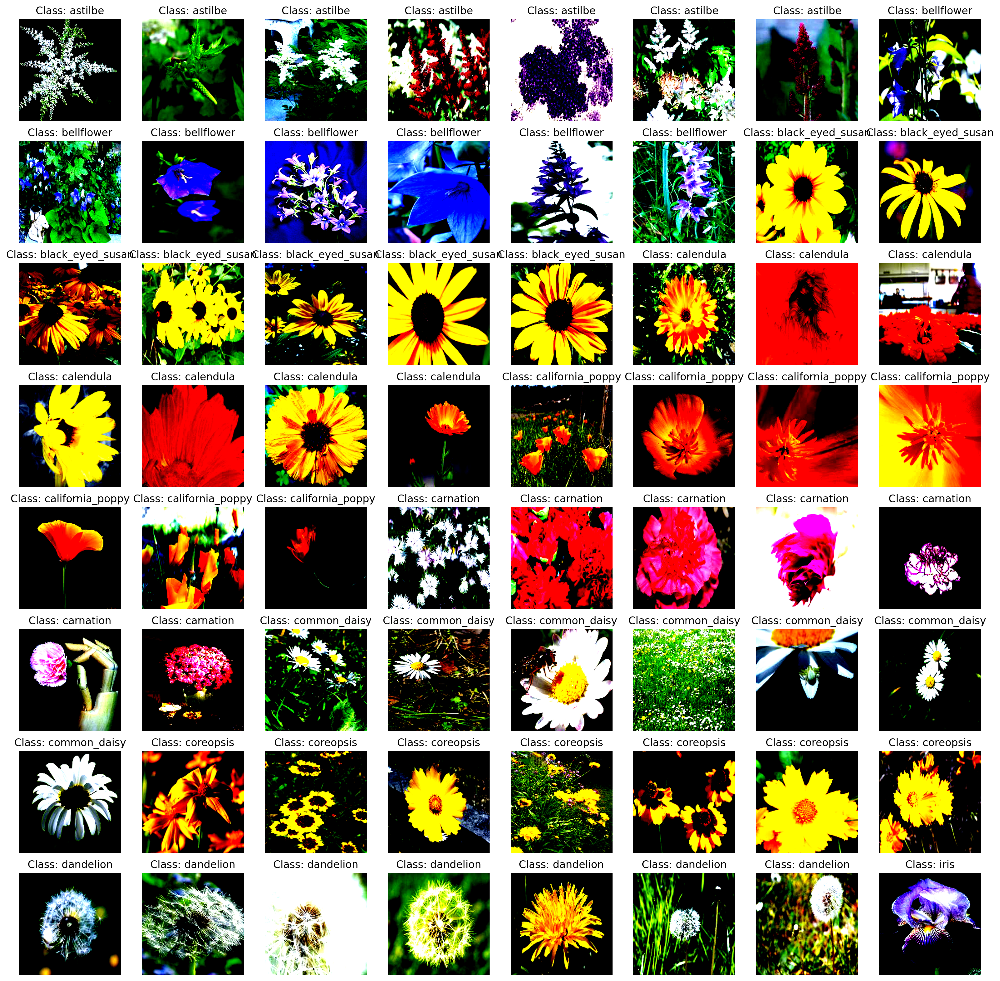

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you have a test_loader that provides images
# test_loader is an iterator that returns images as inputs

# Get the batch of images from the test_loader
images, labels = next(iter(test_loader))

# Convert the images from tensor to numpy array
images = images.numpy()

# Get the number of images in the batch
num_images = images.shape[0]

# Create a subplot with appropriate number of rows and columns based on the number of images
num_rows = int(np.sqrt(num_images))
num_cols = int(np.ceil(num_images / num_rows))

class_names = {0: 'astilbe',
 1:'bellflower',
 2:'black_eyed_susan',
 3:'calendula',
 4:'california_poppy',
 5: 'carnation',
 6: 'common_daisy',
 7: 'coreopsis',
 8: 'dandelion',
 9: 'iris',
 10: 'rose',
 11: 'sunflower',
 12: 'tulip',
 13: 'water_lily'}


# Set the figure size to (10,10)
plt.figure(figsize=(20, 20))

# Loop through each image and plot it in a subplot
for i in range(num_images):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.imshow(images[i].transpose((1, 2, 0)))  # Transpose to convert from (C, H, W) to (H, W, C)
    plt.title(f'Class: {class_names[labels[i].item()]}')  # Use the dictionary to map class numbers to class names
    plt.axis('off')

# Show the plot
plt.show()

In [13]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001)

In [14]:
num_epochs = 30
dataframe = pandas.DataFrame({
    "Epoch":pandas.Series(dtype="int"),
    "train_loss":pandas.Series(dtype="float"),
    "train_accuracy":pandas.Series(dtype="float"),
    "val_loss":pandas.Series(dtype="float"),
    "val_accuracy":pandas.Series(dtype="float")
})
for epoch in range(num_epochs):
    # Train mode
    model.train()
    train_loss = 0
    train_correct = 0
    for feature, target in train_loader:
        feature, target = feature.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(feature)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * feature.shape[0]
        train_correct += (output.argmax(1) == target).sum().item()
    train_loss /= len(training_data)
    train_accuracy = train_correct / len(training_data)

    # Validation mode
    model.eval()
    val_loss = 0
    val_correct = 0
    with torch.no_grad():
        for feature, target in validation_loader:
            feature, target = feature.to(device), target.to(device)
            output = model(feature)
            loss = criterion(output, target)
            val_loss += loss.item() * feature.shape[0]
            val_correct += (output.argmax(1) == target).sum().item()
    val_loss /= len(validation_data)
    val_accuracy = val_correct / len(validation_data)

    # Print results for this epoch
    print('Epoch [{}/{}], Train Loss: {:.5f}, Train Acc: {:.5f}%, Val Loss: {:.5f}, Val Acc: {:.5f}%'
          .format(epoch+1, num_epochs, train_loss, train_accuracy*100, val_loss, val_accuracy*100))
    dataframe.loc[len(dataframe.index)] = [epoch+1, train_loss, train_accuracy, val_loss, val_accuracy]

Epoch [1/30], Train Loss: 2.50441, Train Acc: 21.25788%, Val Loss: 2.30844, Val Acc: 29.59184%
Epoch [2/30], Train Loss: 2.21942, Train Acc: 31.27840%, Val Loss: 2.05767, Val Acc: 32.65306%
Epoch [3/30], Train Loss: 2.01221, Train Acc: 36.62953%, Val Loss: 1.88033, Val Acc: 36.73469%
Epoch [4/30], Train Loss: 1.87284, Train Acc: 40.58056%, Val Loss: 1.77775, Val Acc: 40.81633%
Epoch [5/30], Train Loss: 1.77960, Train Acc: 42.72834%, Val Loss: 1.72161, Val Acc: 41.83673%
Epoch [6/30], Train Loss: 1.70180, Train Acc: 44.56091%, Val Loss: 1.62387, Val Acc: 42.85714%
Epoch [7/30], Train Loss: 1.63303, Train Acc: 46.73068%, Val Loss: 1.57763, Val Acc: 42.85714%
Epoch [8/30], Train Loss: 1.57665, Train Acc: 48.10878%, Val Loss: 1.56243, Val Acc: 45.91837%
Epoch [9/30], Train Loss: 1.52147, Train Acc: 49.70679%, Val Loss: 1.49761, Val Acc: 45.91837%
Epoch [10/30], Train Loss: 1.46838, Train Acc: 51.20217%, Val Loss: 1.48392, Val Acc: 45.91837%
Epoch [11/30], Train Loss: 1.41457, Train Acc: 52

In [15]:
dataframe.head()

,Epoch,train_loss,train_accuracy,val_loss,val_accuracy
0,1.0,2.504409,0.212579,2.308439,0.295918
1,2.0,2.219418,0.312784,2.057672,0.326531
2,3.0,2.012207,0.366295,1.880329,0.367347
3,4.0,1.872837,0.405806,1.777746,0.408163
4,5.0,1.779604,0.427283,1.721608,0.418367


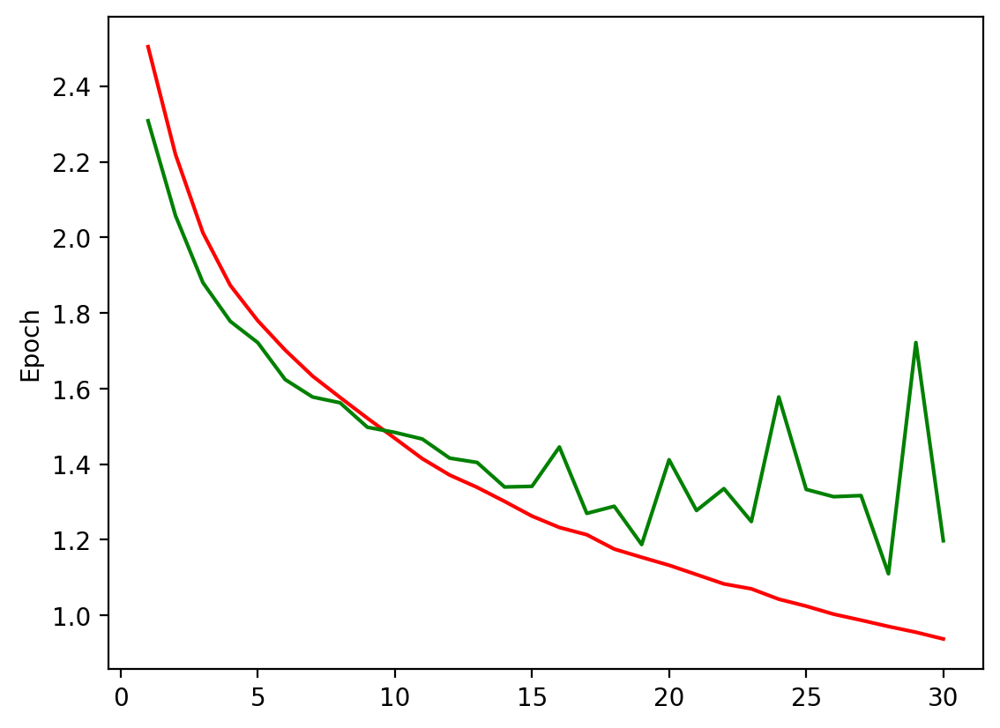

In [16]:
import matplotlib.pyplot as plot

plot.plot(dataframe.Epoch,dataframe.train_loss,'r',label="Training Loss")
plot.plot(dataframe.Epoch,dataframe.val_loss,'g',label="Validation Loss")
plot.ylabel("Epoch")
plot.show()

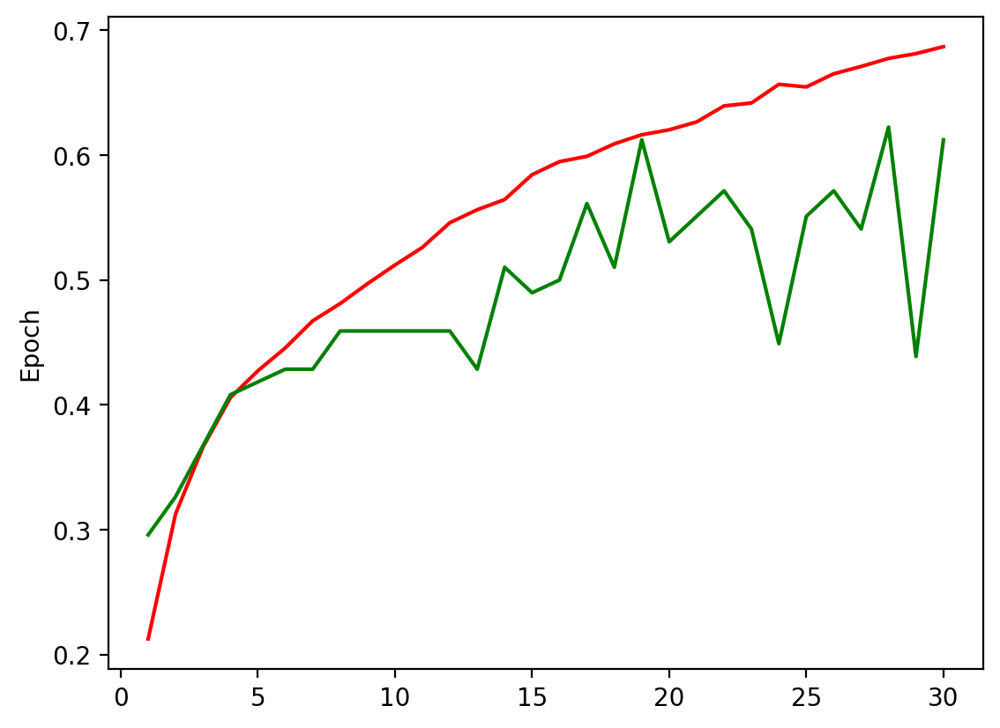

In [17]:
plot.plot(dataframe.Epoch,dataframe.train_accuracy,'r',label="Training Accuracy")
plot.plot(dataframe.Epoch,dataframe.val_accuracy,'g',label='Validation Accuracy')
plot.ylabel("Epoch")
plot.show()

In [18]:
model.eval()  # set model to evaluation mode
correct = 0
total = 0
with torch.no_grad():
    for data in test_loader:
        inputs, labels = data[0].to(device), data[1].to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = 100 * correct / total
print(f'Test accuracy: {accuracy:.5f} %')

Test accuracy: 61.22449 %


In [19]:
class_names = training_data.classes
class_names

['astilbe',
 'bellflower',
 'black_eyed_susan',
 'calendula',
 'california_poppy',
 'carnation',
 'common_daisy',
 'coreopsis',
 'dandelion',
 'iris',
 'rose',
 'sunflower',
 'tulip',
 'water_lily']

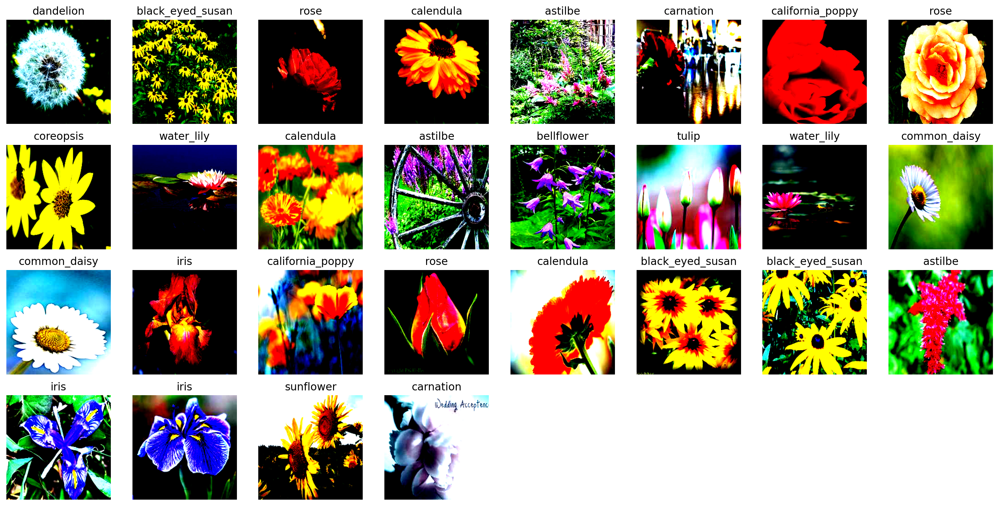

In [20]:
# Get a batch of training data
inputs, classes = next(iter(train_loader))
inputs = inputs.numpy()


# imshow()
fig = plt.figure(figsize=(20, 20))
for i in range(28):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.imshow(inputs[i].transpose((1, 2, 0)))  # Transpose to convert from (C, H, W) to (H, W, C)
    plt.title(f'{class_names[classes[i].item()]}')  # Use the dictionary to map class numbers to class names
    plt.axis('off')

# Show the plot

plt.show()
fig.savefig('r5_flower_images.png')

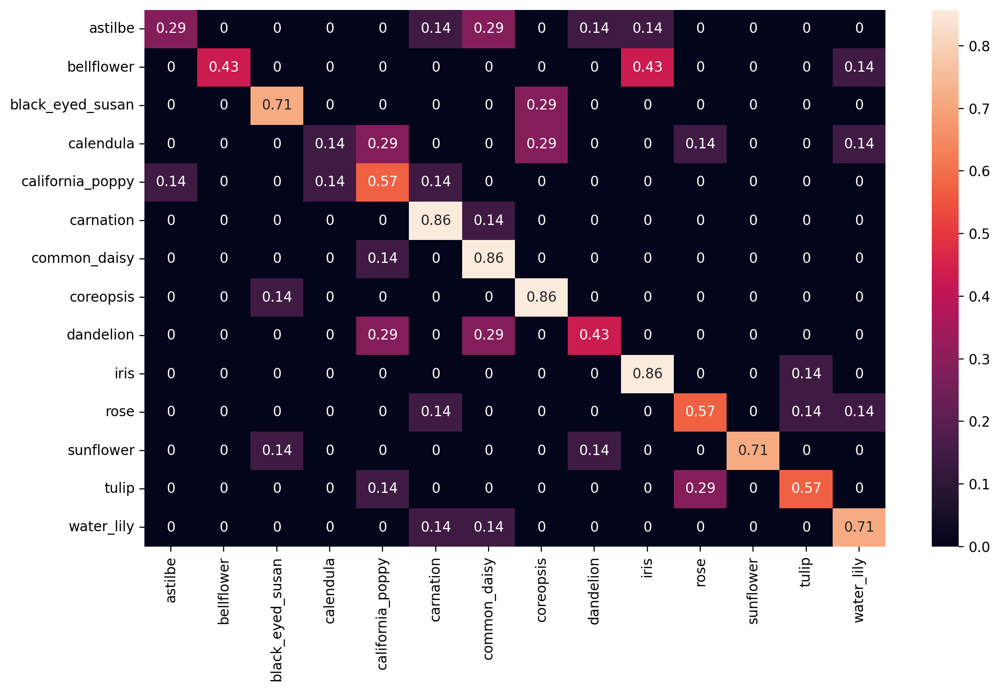

In [21]:
import torch
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

y_pred = []
y_true = []

# Iterate over test data
for data in test_loader:
    inputs, labels = data[0].to(device), data[1].to(device)
    output = model(inputs)  # Feed Network

    output = (torch.max(torch.exp(output), 1)[1]).data.cpu().numpy()
    y_pred.extend(output)  # Save Prediction

    labels = labels.data.cpu().numpy()
    y_true.extend(labels)  # Save Truth

# Constant for classes
class_names =testing_data.classes  # Make sure this is defined correctly

# Build confusion matrix
cf_matrix = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], index=[i for i in class_names],
                     columns=[i for i in class_names])

# Plot heatmap of the confusion matrix
plt.figure(figsize=(12, 7))
sn.heatmap(df_cm, annot=True)
plt.savefig('res_net_5_Classes_CM.png')
plt.show()


In [22]:
torch.save(model, f"resnet5.pth")
# pickle.dump(train_results, open(f"train_results.pkl", "wb"))

In [23]:
dataframe.to_csv("r_net_5_Classes.csv",index=False)

In [24]:
from sklearn.datasets import make_circles
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, classification_report

# Assuming y_true and y_pred are already defined
print("Overall Accuracy: {:.5f}".format(accuracy_score(y_true=y_true, y_pred=y_pred)))

# Print classification report with 5 decimals for the precision, recall, and f1-score
print(classification_report(y_true, y_pred, target_names=testing_data.classes, digits=5))


Overall Accuracy: 0.61224
                  precision    recall  f1-score   support

         astilbe    0.66667   0.28571   0.40000         7
      bellflower    1.00000   0.42857   0.60000         7
black_eyed_susan    0.71429   0.71429   0.71429         7
       calendula    0.50000   0.14286   0.22222         7
california_poppy    0.40000   0.57143   0.47059         7
       carnation    0.60000   0.85714   0.70588         7
    common_daisy    0.50000   0.85714   0.63158         7
       coreopsis    0.60000   0.85714   0.70588         7
       dandelion    0.60000   0.42857   0.50000         7
            iris    0.60000   0.85714   0.70588         7
            rose    0.57143   0.57143   0.57143         7
       sunflower    1.00000   0.71429   0.83333         7
           tulip    0.66667   0.57143   0.61538         7
      water_lily    0.62500   0.71429   0.66667         7

        accuracy                        0.61224        98
       macro avg    0.64600   0.61224   0.59

In [25]:
pip install ptflops

In [26]:
from ptflops import get_model_complexity_info

macs, params = get_model_complexity_info(model, (3, 224, 224), as_strings=False,
                                       print_per_layer_stat=False, verbose=True)
print('{:<30}  {:<8}'.format('Computational complexity in FLOPs: ', macs*2))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

Computational complexity in FLOPs:   3649615900
Number of parameters:           11183694


In [27]:
#TSNE
# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.eval()
targets_list = []
outputs_list = []

with torch.no_grad():
    for idx, (inputs, targets) in enumerate(train_loader):
        inputs = inputs.to(device)
        targets = targets.to(device)
        targets_np = targets.data.cpu().numpy()

        outputs = model(inputs)
        outputs_np = outputs.data.cpu().numpy()

        targets_list.append(targets_np)
        outputs_list.append(outputs_np)

targets = np.concatenate(targets_list, axis=0)
outputs = np.concatenate(outputs_list, axis=0).astype(np.float64)

generating t-SNE plot...


<ipython-input-28-a02b61ae90b6>:15: UserWarning: 
The palette list has fewer values (10) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(


TSNE Image is generated


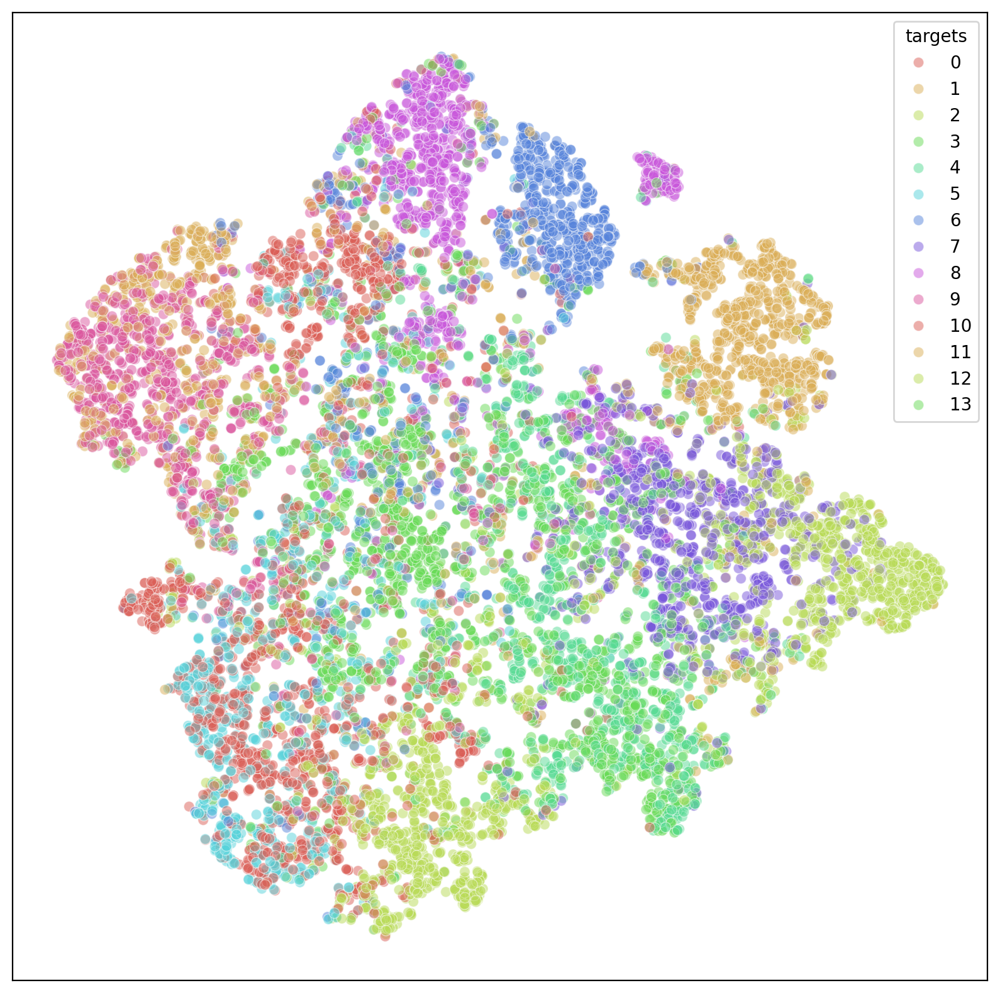

In [28]:
import pandas as pd
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt
print('generating t-SNE plot...')
# tsne_output = bh_sne(outputs)
tsne = TSNE(random_state=0)
tsne_output = tsne.fit_transform(outputs)


df = pd.DataFrame(tsne_output, columns=['x', 'y'])
df['targets'] = targets

plt.rcParams['figure.figsize'] = 10, 10
sns.scatterplot(
    x='x', y='y',
    hue='targets',
    palette=sns.color_palette("hls", 10),
    data=df,
    marker='o',
    legend="full",
    alpha=0.5
)

plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')

plt.savefig('tsne5_resnet.png', bbox_inches='tight')
print('TSNE Image is generated')